# **Signal Processing Assignment 4**

In [7]:
import numpy as np
from scipy.io import loadmat
import matplotlib.pyplot as plt
import pyart
import xarray as xr
from datetime import datetime
from matplotlib import rc
from scipy.signal import correlate

# plotting set up
plt.rcParams['axes.labelweight'] = 'normal'
plt.rcParams['text.latex.preamble'] = r'\usepackage{bm}'
rc('font', family='sans-serif')
rc('font', weight='normal', size=15)
rc('figure', facecolor='white')

### <u>Question 1</u>:

### The files have both X_h and X_v matrices containing the I/Q data from the horizontal and vertical polarizations, respectively. Using your previous code, calculate the powers from both horizontal and vertical polarizations, then implement a “range correction” process in order to estimate reflectivity factor (in dBZ) for both polarizations. You may need to “calibrate” (aka shift) the reflectivity factor values by a constant offset to bring it into line with the KTLX values given in the plot below. Plot PPIs for both horizontal and vertical reflectivity factors (ZHH and ZVV), using all pulses. Also estimate and plot the reflectivity factors using only 1 pulse and 5 pulses. Comment on the effects of dwell time on the error of your estimates.

Read in I/Q file

In [8]:
dfile = "/Users/robbyfrost/Documents/Classes/Radar_Theory/SP3/KTLX_230226_032905181_02.mat"
ds = loadmat(dfile)
tstr = ''
for i in range(ds['scan_time'][0].size):
    tstr += str(ds['scan_time'][0][i])
tplot = datetime.strptime(tstr, "%Y%m%d%H%M%S")

Set arrays

In [9]:
Xh = ds['X_h']
Xv = ds['X_v']
num_pulses = int(ds['num_pulses'][0,0])
rmin = float(ds['r_min'][0,0])
delr = float(ds['delr'][0,0])
rmax = rmin + delr*Xh.shape[1]
ZDRcal = ds['ZDRcal']
Zcal = ds['Zcal']
prt = ds['pri'][0][0]

r = np.arange(rmin, rmax, delr)
az = ds['az_set'][0,:]

Functions

In [10]:
# calculate power
def calc_power(ppr, Xh, Xv):
    """
    Calculate returned power from I/Q signal with custom number of pulses averaged together

    :param int ppr: Number of pulses per ray
    :param array Xh: Horizontal complex returned signal
    :param array Xv: Vertical complex returned signal
    """

    # original array shapes
    naz, nr, npulse = Xh.shape
    total_pulses = npulse * naz
    pulse = np.arange(1, total_pulses+1)

    # flatten into (total_pulses, range)
    Xh_2d = Xh.transpose(0, 2, 1).reshape(-1, nr)  # shape (naz*npulse, nr)
    Xv_2d = Xv.transpose(0, 2, 1).reshape(-1, nr)  # same for vertical channel

    # compute power
    powh = np.real(Xh_2d * np.conj(Xh_2d))
    powv = np.real(Xv_2d * np.conj(Xv_2d))

    # put in xarray (quicker)
    powh_xr = xr.DataArray(
        powh,
        dims=('pulse', 'r'),
        coords={
            'pulse': pulse,
            'r': r,
        }
    )
    powv_xr = xr.DataArray(
        powv,
        dims=('pulse', 'r'),
        coords={
            'pulse': pulse,
            'r': r,
        }
    )
    # average pulses
    powh_avg = powh_xr.coarsen(pulse=ppr).mean().values
    powv_avg = powv_xr.coarsen(pulse=ppr).mean().values
    
    # # arrays for averaged power (numpy version, slower)
    # powh_avg, powv_avg = [np.empty((total_pulses//ppr, nr)) for _ in range(2)]
    # # loop over pulse, range
    # for jp in range(0,total_pulses,ppr):
    #     jaz = jp//ppr
    #     for jr in range(nr):
    #         # average pulses
    #         powh_avg[jaz,jr] = np.nanmean(powh[jp:jp+ppr,jr])
    #         powv_avg[jaz,jr] = np.nanmean(powv[jp:jp+ppr,jr])

    return powh_avg, powv_avg

# update azimuths, cartesian points
def get_az_x_y(ppr, Xh, az):

    # original array shapes
    naz, nr, npulse = Xh.shape
    total_pulses = npulse * naz
    pulse = np.arange(1, total_pulses+1)

    # unwrap azimuth
    az_cont = np.unwrap(np.deg2rad(az))   # radians
    az_cont = np.rad2deg(az_cont)         # back to degrees

    # flatten repeated pulses
    az_flat = np.repeat(az_cont, npulse)  # shape (total_pulses,)
    # number of averaged pulses
    num_avg = total_pulses // ppr

    # average azimuths in each block of des_num_pulses
    az_samp = az_flat[:num_avg*ppr].reshape(num_avg, ppr).mean(axis=1)
    # wrap back to [0,360)
    az_samp = az_samp % 360

    # cartesian locations
    x = r[:,np.newaxis].dot(np.sin(np.deg2rad(az_samp[np.newaxis,:]))).T
    y = r[:,np.newaxis].dot(np.cos(np.deg2rad(az_samp[np.newaxis,:]))).T

    return az_samp, x, y

Plot reflectivity

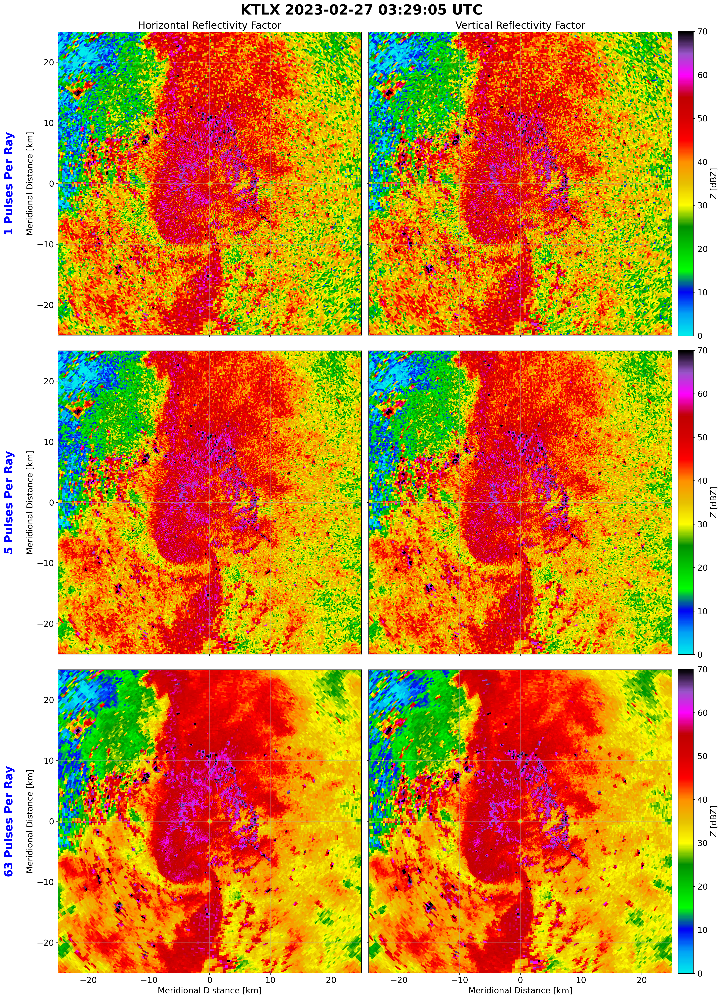

In [11]:
fig, axs = plt.subplots(figsize=(18,25),
                       dpi=200,
                       constrained_layout=True,
                       ncols=2,
                       nrows=3,
                       sharex=True,
                       sharey=True)
fig.suptitle(f"KTLX {tplot} UTC",
             fontsize=25, 
             fontweight='bold')

pprs = [1, 5, 63]
for i in range(len(pprs)):
    # vars for plotting
    powh, powv = calc_power(pprs[i], Xh, Xv)
    Zh = 10*np.log10(powh) + 20*np.log10(r) - 10*np.log10(Zcal)
    Zv = 10*np.log10(powv) + 20*np.log10(r) - 10*np.log10(Zcal)
    az_samp, x, y = get_az_x_y(pprs[i], Xh, az)
    
    # horizontal reflectivity factor
    ax = axs[i,0]
    pcm = ax.pcolormesh(x/1e3, y/1e3, Zh,
                        vmin=0, vmax=70,
                        cmap='NWSRef')
    ax.set_ylabel("Meridional Distance [km]")
    ax.text(-33, 0, f"{pprs[i]} Pulses Per Ray", 
            ha='center', va='center', rotation="vertical",
            fontsize=20, fontweight='bold', c='blue')
    # vertical reflectivity factor
    ax = axs[i,1]
    pcm = ax.pcolormesh(x/1e3, y/1e3, Zv,
                        vmin=0, vmax=70,
                        cmap='NWSRef')
    cbar = plt.colorbar(pcm, ax=ax, label="$Z$ [dBZ]", orientation='vertical', pad=0.02)

# clean up
axs[0,0].set_title("Horizontal Reflectivity Factor")
axs[0,1].set_title("Vertical Reflectivity Factor")
axs[2,0].set_xlabel("Meridional Distance [km]")
axs[2,1].set_xlabel("Meridional Distance [km]")
for ax in axs.flatten():
    ax.set_aspect('equal')
    ax.set_xlim(-25,25)
    ax.set_ylim(-25,25)
    ax.grid(alpha=0.5)

### <u>Question 2</u>:

### Compare your results from the previous question to those from the operational data produced by the corresponding radar (download from NCEI site: https://www.ncei.noaa.gov/nexradinv/map.jsp). What similarities and differences do you see?

In [31]:
dmom = "/Users/robbyfrost/Documents/Classes/Radar_Theory/SP4/KTLX20230227_032848_V06.ar2v"
mradar = pyart.io.read(dmom)

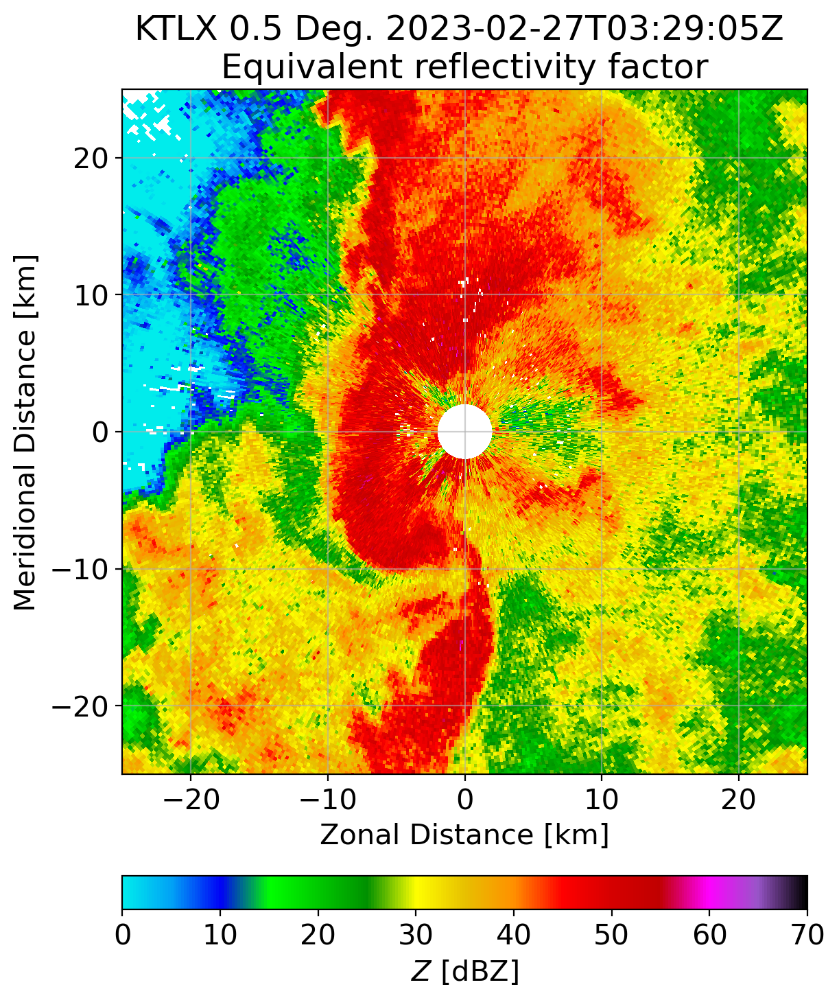

In [36]:
fig, ax = plt.subplots(figsize=(6,8),
                       constrained_layout=True,
                       dpi=200)

display = pyart.graph.RadarDisplay(mradar.extract_sweeps([1]))
display.plot_ppi('reflectivity', ax=ax, 
                vmin=0, vmax=70,
                cmap="NWSRef",
                colorbar_flag=False,
                title_use_sweep_time=True,
                axislabels_flag=False)
fig.colorbar(display.plots[0], ax=ax, label='$Z$ [dBZ]', orientation='horizontal', pad=0.025)

ax.set_aspect('equal')
ax.set_xlim(-25,25)
ax.set_xlabel("Zonal Distance [km]")
ax.set_ylabel("Meridional Distance [km]")
ax.set_ylim(-25,25)
ax.grid(alpha=0.6)

### <u>Question 3</u>:

### Plot a PPI of radial velocity using Eq. (1). Use all pulses in the Doppler scan (scan index of 2, 4, or 6). What do you notice in the Doppler velocity field? Now, plot the same PPI but with only 5 pulses. What do you notice about the variance of the data? Why is this the case?

Function to calculate radial velocity

In [12]:
# calculate power
def calc_vr(ppr, Xh):
    """
    Calculate returned power from I/Q signal with custom number of pulses averaged together

    :param int ppr: Number of pulses per ray
    :param array Xh: Horizontal complex returned signal
    :param array Xv: Vertical complex returned signal
    """

    # original array shapes
    naz, nr, npulse = Xh.shape
    total_pulses = npulse * naz
    pulse = np.arange(1, total_pulses+1)

    # flatten into (total_pulses, range)
    Xh_2d = Xh.transpose(0, 2, 1).reshape(-1, nr)  # shape (naz*npulse, nr)

    # array to hold vr
    vr = np.empty((total_pulses//ppr, nr))

    # loop over pulse, range
    for jp in range(0,total_pulses,ppr):
        jaz = jp//ppr
        for jr in range(nr):
            # lag-1 autocorr
            if jp+ppr+1 < total_pulses:
                R1 = (1/npulse) * np.nansum(Xh_2d[jp+1:jp+ppr+1,jr] * np.conj(Xh_2d[jp:jp+ppr,jr]))
            else:
                R1 = (1/npulse) * np.nansum(Xh_2d[jp+1:total_pulses,jr] * np.conj(Xh_2d[jp:jp+ppr-1,jr]))
            # calculate radial velocity
            vr[jaz,jr] = -(0.1/(4*np.pi*prt)) * np.angle(R1)

    return vr

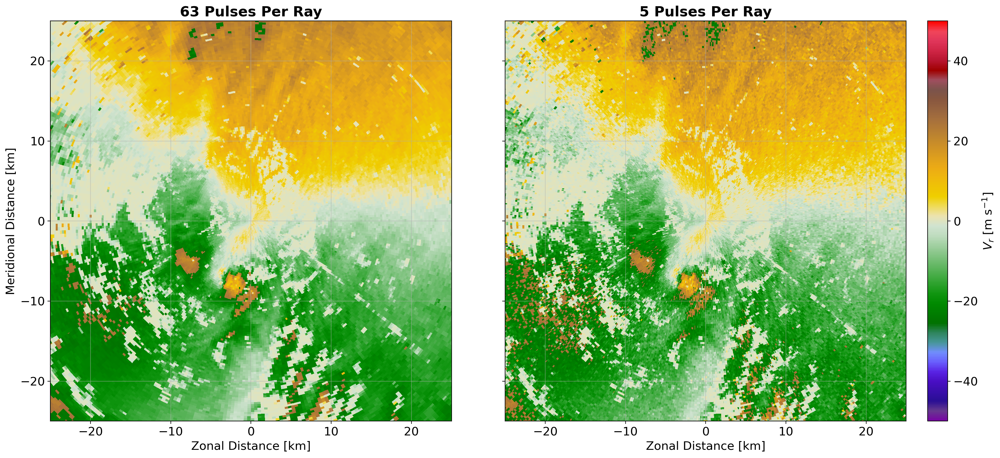

In [13]:
fig, axs = plt.subplots(figsize=(17.5,8),
                       dpi=200,
                       constrained_layout=True,
                       ncols=2,
                       nrows=1,
                       sharex=True,
                       sharey=True)

# 63 pulses
ppr = 63
_, x, y = get_az_x_y(ppr, Xh, az)
vr = calc_vr(ppr, Xh)
ax = axs[0]
pcm = ax.pcolormesh(x/1e3, y/1e3, vr,
                    cmap='Carbone42',
                    vmin=-50, vmax=50)
ax.set_title("63 Pulses Per Ray", fontweight='bold')
ax.set_ylabel("Meridional Distance [km]")

# 5 pulses
ppr = 5
_, x, y = get_az_x_y(ppr, Xh, az)
vr = calc_vr(ppr, Xh)
ax = axs[1]
pcm = ax.pcolormesh(x/1e3, y/1e3, vr,
                    cmap='Carbone42',
                    vmin=-50, vmax=50)
ax.set_title("5 Pulses Per Ray", fontweight='bold')
plt.colorbar(pcm, ax=ax, orientation='vertical', label="$V_r$ [m s$^{-1}$]")

for ax in axs:
    ax.set_aspect('equal')
    ax.set_xlim(-25,25)
    ax.set_ylim(-25,25)
    ax.grid(alpha=0.5)
    ax.set_xlabel("Zonal Distance [km]")

### <u>Question 4</u>:

### Using the horizontal and vertical power estimates, compute ZDR in dB using Eq. (3) and produce a PPI plot. Use all pulses in the Doppler scan (scans 2, 4, or 6).

In [14]:
powh, powv = calc_power(num_pulses, Xh, Xv)
_, x, y = get_az_x_y(num_pulses, Xh, az)
Zh = 10*np.log10(powh) + 20*np.log10(r) - 10*np.log10(Zcal)
zdr = 10 * np.log10(powh / powv)

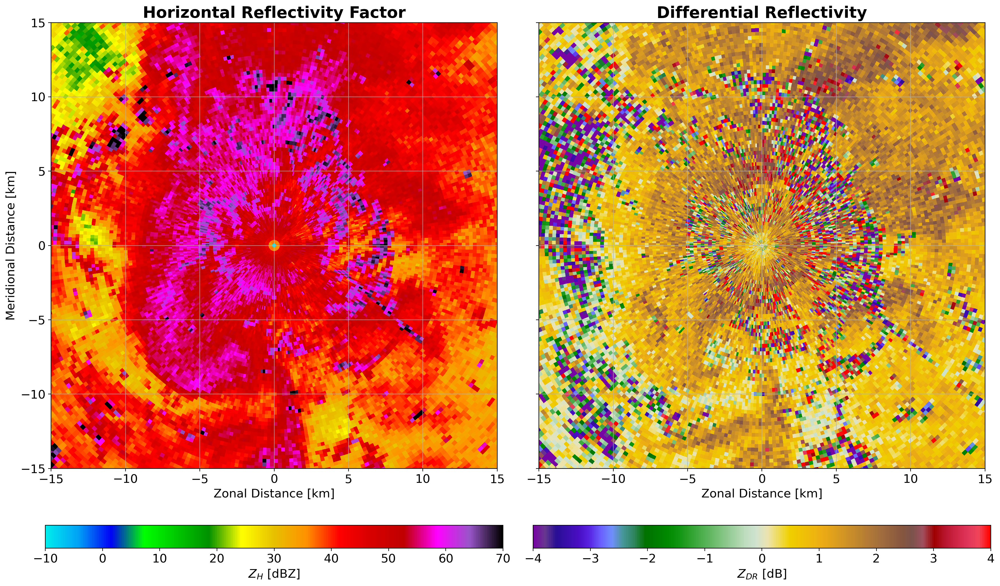

In [15]:
fig, axs = plt.subplots(figsize=(17.5,10),
                       dpi=200,
                       constrained_layout=True,
                       ncols=2,
                       nrows=1,
                       sharex=True,
                       sharey=True)

# reflectivity
ax = axs[0]
pcm = ax.pcolormesh(x/1e3, y/1e3, Zh,
                    cmap='NWSRef',
                    vmin=-10, vmax=70)
ax.set_title("Horizontal Reflectivity Factor", fontweight='bold', fontsize=20)
plt.colorbar(pcm, ax=ax, orientation='horizontal', label="$Z_{H}$ [dBZ]")
ax.set_ylabel("Meridional Distance [km]")

# ZDR
ax = axs[1]
pcm = ax.pcolormesh(x/1e3, y/1e3, zdr,
                    cmap='Carbone42',
                    vmin=-4, vmax=4)
ax.set_title("Differential Reflectivity", fontweight='bold', fontsize=20)
plt.colorbar(pcm, ax=ax, orientation='horizontal', label="$Z_{DR}$ [dB]")

for ax in axs:
    ax.set_aspect('equal')
    ax.set_xlim(-15,15)
    ax.set_ylim(-15,15)
    ax.grid(alpha=0.75)
    ax.set_xlabel("Zonal Distance [km]")

### <u>Question 5</u>:

### Compute the cross-correlation coefficient, ρHV , from the raw time series signal using Eq. (4) and the Matlab command xcorr. Produce a PPI plot with your results in similar fashion to your other plots. Use all 50 pulses. A good colormap to use from boonlib.m would be carbmap, with a range from 0.7 to 1.05.

Calculate $\rho_{HV}$

In [16]:
# calculate power
def calc_rhohv(ppr, Xh, Xv):
    """
    Calculate cross-correlation coefficient

    :param int ppr: Number of pulses per ray
    :param array Xh: Horizontal complex returned signal
    :param array Xv: Vertical complex returned signal
    """

    # original array shapes
    naz, nr, npulse = Xh.shape
    total_pulses = npulse * naz
    pulse = np.arange(1, total_pulses+1)

    # calculate power
    powh, powv = calc_power(ppr, Xh, Xv)

    # flatten into (total_pulses, range)
    Xh_2d = Xh.transpose(0, 2, 1).reshape(-1, nr)  # shape (naz*npulse, nr)
    Xv_2d = Xv.transpose(0, 2, 1).reshape(-1, nr)  # shape (naz*npulse, nr)

    # array to hold rhohv
    rhohv = np.empty((total_pulses//ppr, nr))

    # loop over az, r
    for jp in range(0,total_pulses,ppr):
        jaz = jp//ppr
        for jr in range(nr):
            # cross correlation
            Rhv0 = np.nanmean(Xh_2d[jp:jp+ppr,jr] * np.conj(Xv_2d[jp:jp+ppr,jr]))
            # calculate rhohv
            rhohv[jaz,jr] = np.abs(Rhv0) / (powh[jaz,jr] * powv[jaz,jr])**0.5

    return rhohv

In [17]:
# pulses per ray
ppr = num_pulses
# dimensions
_, x, y = get_az_x_y(ppr, Xh, az)

# power
powh, powv = calc_power(ppr, Xh, Xv)
# horizontal reflectivity factor
Zh = 10*np.log10(powh) + 20*np.log10(r) - 10*np.log10(Zcal)
# radial velocity
vr = calc_vr(ppr, Xh)
# differential reflectivity
zdr = 10 * np.log10(powh / powv)
# cross-correlation coefficient
rhohv = calc_rhohv(ppr, Xh, Xv)

# noise
noiseh = np.nanmean(powh[:,-100:])
noisev = np.nanmean(powv[:,-100:])
noise = (noiseh + noisev) / 2
# signal to noise ratio
snr = ((powh + powv)/2) / noise
10 * np.log10(snr)
# mask low snr
snr_mask = snr > 20

# mask radar variables
Zhm = np.where(snr_mask, Zh, np.nan)
vrm = np.where(snr_mask, vr, np.nan)
zdrm = np.where(snr_mask, zdr, np.nan)
rhohvm = np.where(snr_mask, rhohv, np.nan)

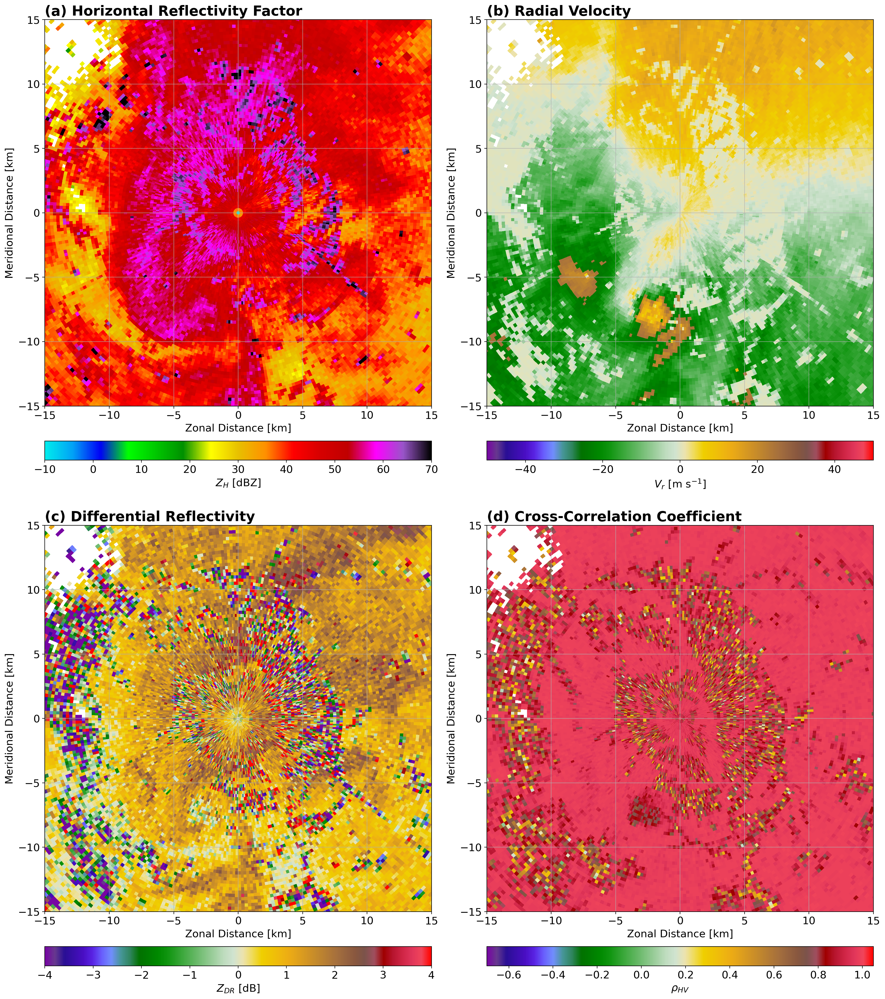

In [18]:
fig, axs = plt.subplots(figsize=(17.5,20),
                       dpi=200,
                       constrained_layout=True,
                       ncols=2,
                       nrows=2)

# Z
ax = axs[0,0]
pcm = ax.pcolormesh(x/1e3, y/1e3, Zhm,
                    cmap='NWSRef',
                    vmin=-10, vmax=70)
ax.set_title("(a) Horizontal Reflectivity Factor", fontweight='bold', fontsize=20, loc='left')
plt.colorbar(pcm, ax=ax, orientation='horizontal', label="$Z_{H}$ [dBZ]", pad=0.015)
# VEL
ax = axs[0,1]
pcm = ax.pcolormesh(x/1e3, y/1e3, vrm,
                    cmap='Carbone42',
                    vmin=-50, vmax=50)
ax.set_title("(b) Radial Velocity", fontweight='bold', fontsize=20, loc='left')
plt.colorbar(pcm, ax=ax, orientation='horizontal', label="$V_r$ [m s$^{-1}$]", pad=0.015)
# ZDR
ax = axs[1,0]
pcm = ax.pcolormesh(x/1e3, y/1e3, zdrm,
                    cmap='Carbone42',
                    vmin=-4, vmax=4)
ax.set_title("(c) Differential Reflectivity", fontweight='bold', fontsize=20, loc='left')
plt.colorbar(pcm, ax=ax, orientation='horizontal', label="$Z_{DR}$ [dB]", pad=0.015)
# RHOHV
ax = axs[1,1]
pcm = ax.pcolormesh(x/1e3, y/1e3, rhohvm,
                    cmap='Carbone42',
                    vmin=-0.70, vmax=1.05)
ax.set_title("(d) Cross-Correlation Coefficient", fontweight='bold', fontsize=20, loc='left')
plt.colorbar(pcm, ax=ax, orientation='horizontal', label="$\\rho_{HV}$", pad=0.015)

# clean up
for ax in axs.flatten():
    ax.set_aspect('equal')
    ax.set_xlim(-15,15)
    ax.set_ylim(-15,15)
    ax.grid(alpha=0.75)
    ax.set_ylabel("Meridional Distance [km]")
    ax.set_xlabel("Zonal Distance [km]")